# EDA

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import re
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.multioutput import MultiOutputRegressor
from xgboost import XGBRegressor
import os 
import ast
import regex
import matplotlib.dates as mdates
from prophet import Prophet
from statsmodels.tsa.stattools import adfuller


C:\Users\Acer\AppData\Roaming\Python\Python39\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.


Before proceeding to analyze the data. Let's take a look to which kind of data each column is standing for.

1. **Rank**: The ranking position of the song within a specific day.
2. **Title**: The name of the song.
3. **Artists**: The artists credited in the song.
4. **Date**: The date in which this ranking is taking place.
5. **Danceability**: A measure of how suitable a track is for dancing based on tempo, rhythm stability, beat strength, and overall regularity. The value typically ranges from 0 to 1.
6. **Energy**: A measure of the intensity and activity of the song. Energetic tracks feel fast, loud, and noisy, while calm tracks feel slower or softer. Values range from 0 to 1.
7. **Loudness**: The overall volume level of the song in decibels (dB), suppose that averaged across the entire track.
8. **Speechiness**: A measure of the presence of spoken words in a track. Higher values indicate that a track is more speech-like (e.g., podcasts, talk shows).
9. **Acousticness**: A confidence measure of whether the track is acoustic. Higher values indicate a stronger presence of acoustic elements. Value between 0 and 1.
10. **Instrumentalness**: Predicts whether a track contains no vocals. A higher value indicates a more instrumental track.Value betweeen 0 and 1.
11. **Valence**: A measure of the musical positiveness of the song. Tracks with higher valence sound more positive (happy, cheerful), while tracks with lower valence sound more negative (sad, angry). Values between 0 and 1.
12. **# of Artist**: The number of artists credited for the song.
13. **Artist (Ind.)**: The individual artist's name, often used when there are multiple artists credited.
14. **# of Nationality**: The number of nationalities represented by the artists on the track.
15. **Nationality**: The nationality or nationalities of the artist(s).
16. **Continent**: The continent(s) where the artist(s) originates from.
17. **Points (Total)**: The total points scored by the song in a ranking or scoring system.
18. **Points (Ind for each Artist/Nat)**: The points assigned for each individual artist or nationality in relation to the song.
19. **id**: A unique identifier for the song in the dataset.
20. **Song URL**: A link to the song’s page on Spotify.

In [ ]:
import os 
path = os.getcwd()
df1 = pd.read_csv(path + r"\spotify_data\Spotify_Dataset_V3.csv", delimiter=";")
print(df1.shape)
df1.head()

(651936, 20)


,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,Valence,# of Artist,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,0.834,Artist 1,Eslabon Armado,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...
1,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,0.834,Artist 2,Peso Pluma,Nationality 2,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...
2,2,WHERE SHE GOES,Bad Bunny,29/05/2023,0.652,0.800,-4019.0,0.061,0.143,0.629,0.234,Artist 1,Bad Bunny,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...
3,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,0.559,Artist 1,Yng Lvcas,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...
4,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,0.559,Artist 2,Peso Pluma,Nationality 2,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...


In [ ]:
genre_df = pd.read_csv(path + r"\spotify_data\output_with_genres.csv")
genre_df = genre_df[['Title', 'Genre']]
genre_df.drop_duplicates(inplace=True)
genre_df.shape

(7457, 2)

In [5]:
df_merged = pd.merge(df1, genre_df, on='Title', how='left')
df_merged['Genre'] = df_merged['Genre'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
df_merged['Genre'] = df_merged['Genre'].apply(lambda x: regex.sub(r' ', r'-', str(x[0].strip())) if isinstance(x, list) and x else str(''))
df_merged.head()

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,# of Artist,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL,Genre
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,...,Artist 1,Eslabon Armado,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,corrido
1,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,...,Artist 2,Peso Pluma,Nationality 2,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,corrido
2,2,WHERE SHE GOES,Bad Bunny,29/05/2023,0.652,0.800,-4019.0,0.061,0.143,0.629,...,Artist 1,Bad Bunny,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...,reggaeton
3,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,...,Artist 1,Yng Lvcas,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...,reggaeton
4,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,...,Artist 2,Peso Pluma,Nationality 2,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...,reggaeton


In [6]:
df_merged = df_merged[df_merged['Genre'].notna() & (df_merged['Genre'] != '')]
df_merged.shape

(648369, 21)

In [ ]:
df_parent = pd.read_csv(path + r"\spotify_data\parent_genre.csv")
df_parent.head()

,Genre,Parent Genre
0,corrido,latin
1,reggaeton,latin
2,k-pop-girl-group,pop
3,musica-chihuahuense,latin
4,pop,pop


In [8]:
df_transformed = pd.merge(df_merged, df_parent, on='Genre', how='left')
df_transformed.head()

,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Artist (Ind.),# of Nationality,Nationality,Continent,Points (Total),Points (Ind for each Artist/Nat),id,Song URL,Genre,Parent Genre
0,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,...,Eslabon Armado,Nationality 1,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,corrido,latin
1,1,Ella Baila Sola,"Eslabon Armado, Peso Pluma",29/05/2023,0.668,0.758,-5176.0,0.033,0.483,0.000,...,Peso Pluma,Nationality 2,Mexico,Latin-America,200,100.0,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,corrido,latin
2,2,WHERE SHE GOES,Bad Bunny,29/05/2023,0.652,0.800,-4019.0,0.061,0.143,0.629,...,Bad Bunny,Nationality 1,Puerto Rico,Latin-America,199,199.0,7ro0hRteUMfnOioTFI5TG1,https://open.spotify.com/track/7ro0hRteUMfnOio...,reggaeton,latin
3,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,...,Yng Lvcas,Nationality 1,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...,reggaeton,latin
4,3,La Bebe - Remix,"Yng Lvcas, Peso Pluma",29/05/2023,0.812,0.479,-5678.0,0.333,0.213,0.000,...,Peso Pluma,Nationality 2,Mexico,Latin-America,198,99.0,2UW7JaomAMuX9pZrjVpHAU,https://open.spotify.com/track/2UW7JaomAMuX9pZ...,reggaeton,latin


In [ ]:
# Check for NaN values
rows_with_nan = df_transformed.isnull().any(axis=1)
has_nan = rows_with_nan.any()

print(f"Are there any rows with NaN values? {has_nan}")
if has_nan:
    print(f"Number of rows with NaN values: {rows_with_nan.sum()}")

df_transformed.shape

Are there any rows with NaN values? True
Number of rows with NaN values: 13173


(648369, 22)

In [10]:
df_transformed.shape

(648369, 22)

# Train Test Split

In [11]:
df, df_test = train_test_split(df_transformed, test_size=0.2, shuffle=False)
df.shape, df_test.shape

((518695, 22), (129674, 22))

# Train preprocess

In [12]:
print("----------------------- HEAD ------------------")
print(df.head())

----------------------- HEAD ------------------
   Rank            Title                     Artists        Date  \
0     1  Ella Baila Sola  Eslabon Armado, Peso Pluma  29/05/2023   
1     1  Ella Baila Sola  Eslabon Armado, Peso Pluma  29/05/2023   
2     2   WHERE SHE GOES                   Bad Bunny  29/05/2023   
3     3  La Bebe - Remix       Yng Lvcas, Peso Pluma  29/05/2023   
4     3  La Bebe - Remix       Yng Lvcas, Peso Pluma  29/05/2023   

   Danceability  Energy  Loudness  Speechiness  Acousticness  \
0         0.668   0.758   -5176.0        0.033         0.483   
1         0.668   0.758   -5176.0        0.033         0.483   
2         0.652   0.800   -4019.0        0.061         0.143   
3         0.812   0.479   -5678.0        0.333         0.213   
4         0.812   0.479   -5678.0        0.333         0.213   

   Instrumentalness  ...   Artist (Ind.) # of Nationality  Nationality  \
0             0.000  ...  Eslabon Armado    Nationality 1       Mexico   
1         

In [13]:
print("----------------------- DESCRIPTION ------------------")
print(df.describe())

----------------------- DESCRIPTION ------------------
                Rank   Danceability         Energy       Loudness  \
count  518695.000000  518695.000000  518695.000000  518695.000000   
mean      100.740572       0.697479       0.649148   -5292.574429   
std        57.425889       0.135118       0.155819    2850.457146   
min         1.000000       0.073000       0.005000  -34475.000000   
25%        51.000000       0.612000       0.548000   -6862.000000   
50%       100.000000       0.720000       0.670000   -5167.000000   
75%       151.000000       0.795000       0.765000   -3818.000000   
max       200.000000       0.985000       0.996000    1509.000000   

         Speechiness   Acousticness  Instrumentalness        Valence  \
count  518695.000000  518695.000000     518695.000000  518695.000000   
mean        0.110067       0.242798          0.008263       0.528249   
std         0.097408       0.238300          0.057926       0.224955   
min         0.022000       0.000000

In [14]:
for column in df.columns:
    unique_count = df[column].nunique()
    print(f"{column}: {unique_count} unique values")

Rank: 200 unique values
Title: 6246 unique values
Artists: 2485 unique values
Date: 1860 unique values
Danceability: 726 unique values
Energy: 832 unique values
Loudness: 4719 unique values
Speechiness: 518 unique values
Acousticness: 935 unique values
Instrumentalness: 276 unique values
Valence: 934 unique values
# of Artist: 9 unique values
Artist (Ind.): 1923 unique values
# of Nationality: 9 unique values
Nationality: 70 unique values
Continent: 7 unique values
Points (Total): 200 unique values
Points (Ind for each Artist/Nat): 475 unique values
id: 7512 unique values
Song URL: 7512 unique values
Genre: 384 unique values
Parent Genre: 14 unique values


In [15]:
print("\nMissing Values:\n")
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])


Missing Values:

Parent Genre    9348
dtype: int64


In [16]:
print("\nDuplicate Rows:\n")
duplicate_count = df.duplicated().sum()
print(f"Total duplicate rows: {duplicate_count}")


Duplicate Rows:

Total duplicate rows: 0


In [17]:
def clean_text(text):
    return re.sub(r'\$', 's', str(text))

In [18]:
numerical_features = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = ["Title", "Artists", "Date", "# of Artist", "Artist (Ind.)", "# of Nationality", "Nationality", "Continent"]

for feature in categorical_features:
    df[feature] = df[feature].apply(clean_text)

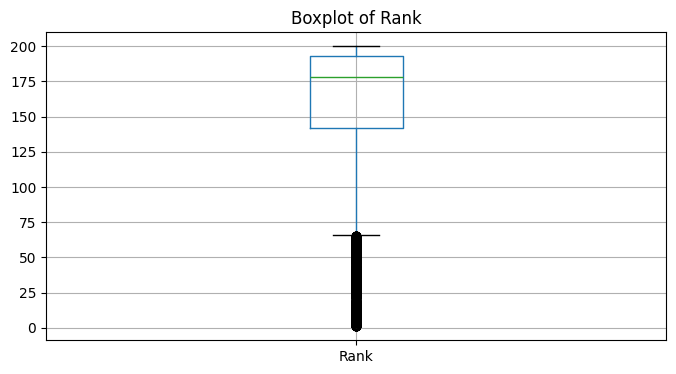

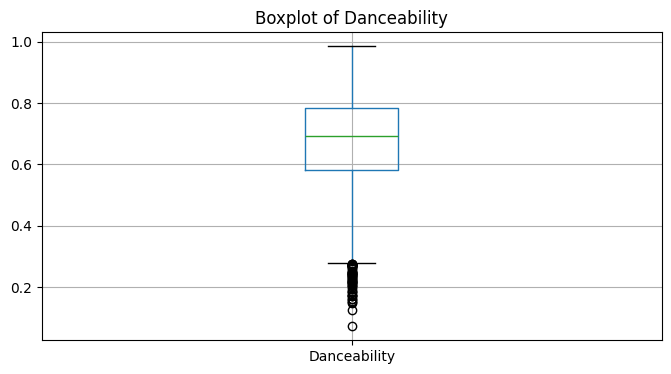

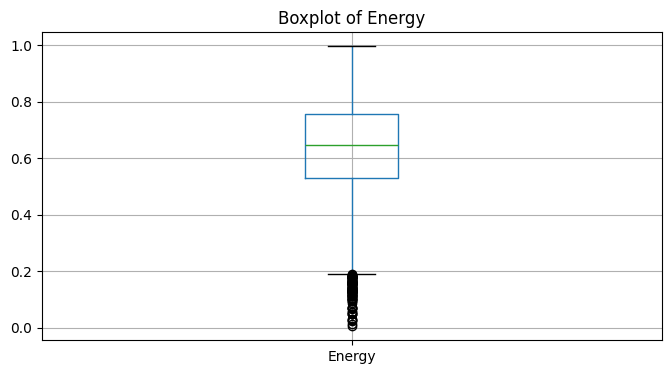

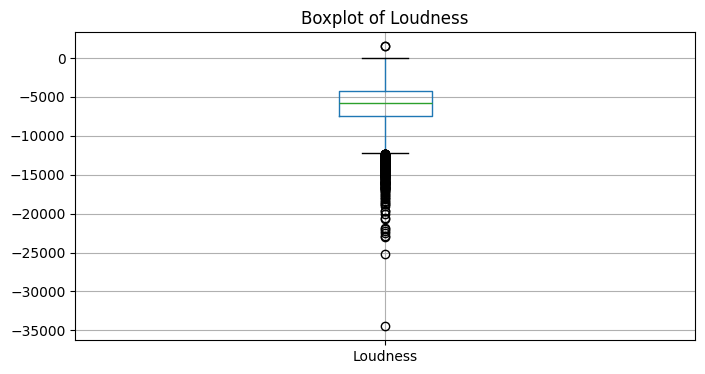

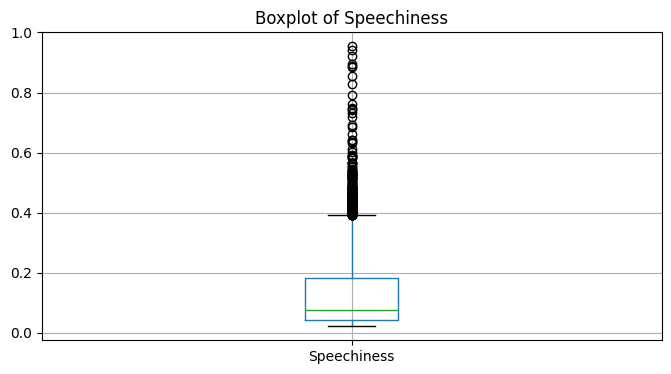

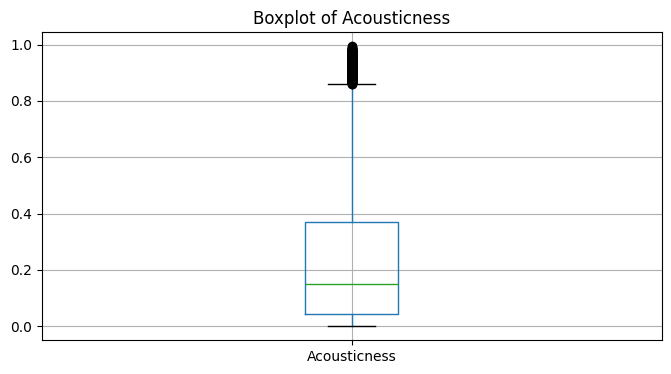

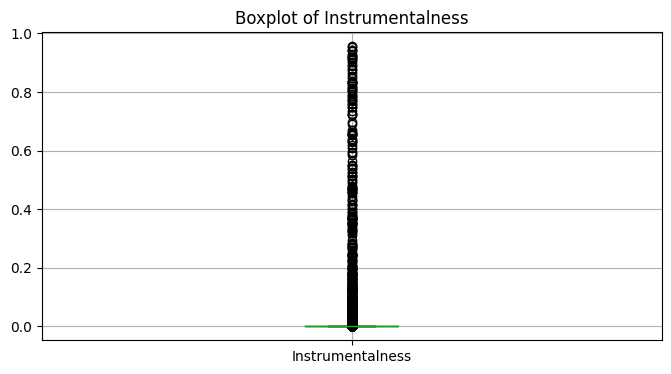

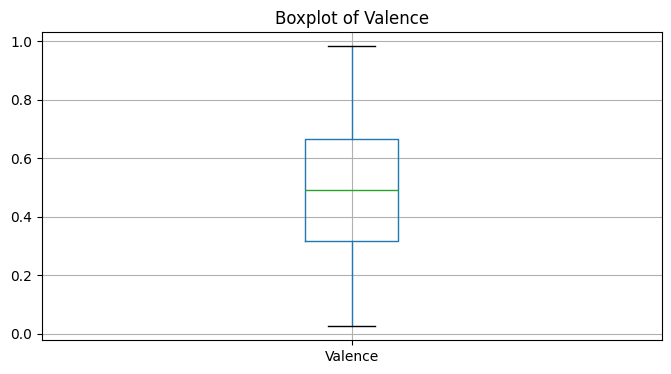

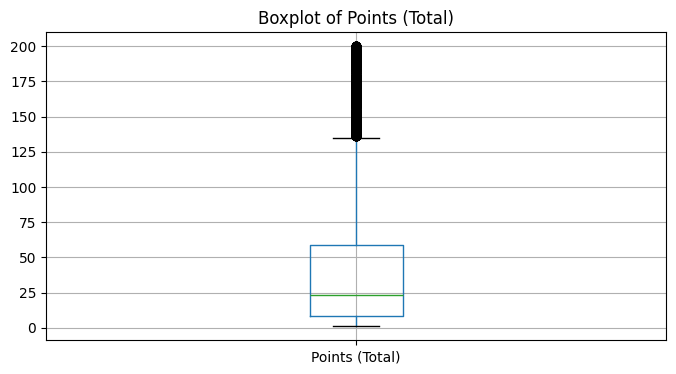

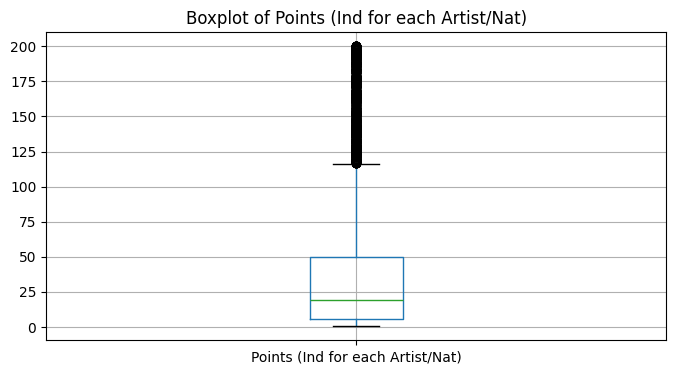

In [310]:
for feature in numerical_features:
    plt.figure(figsize=(8, 4))
    df.boxplot(column=feature)
    plt.title(f"Boxplot of {feature}")
    plt.show()

In [19]:
def remove_outliers_iqr(df: pd.DataFrame, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

In [20]:
df_rm_outliers = remove_outliers_iqr(df, numerical_features)
print(df_rm_outliers.shape)

(388723, 22)


/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 157 (\x9d) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


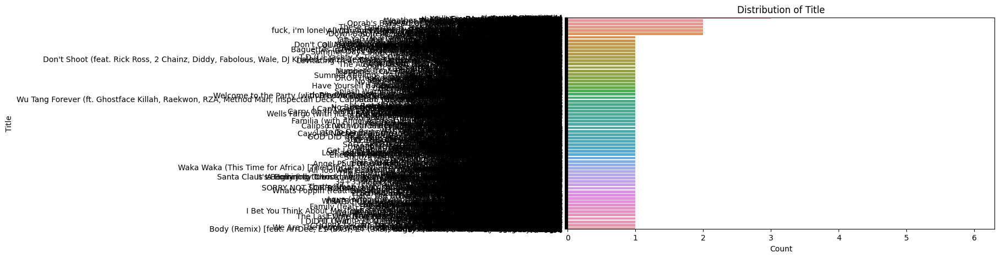

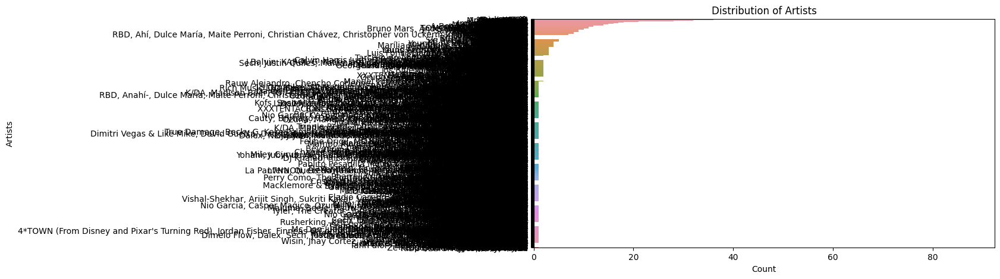

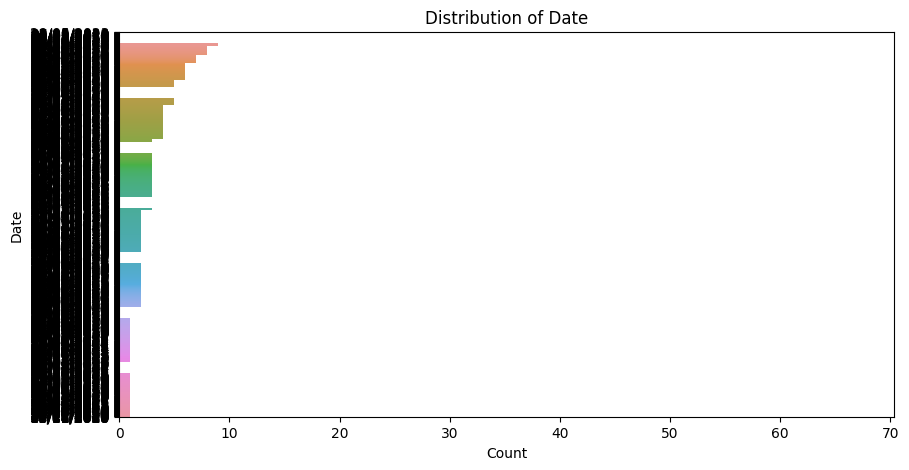

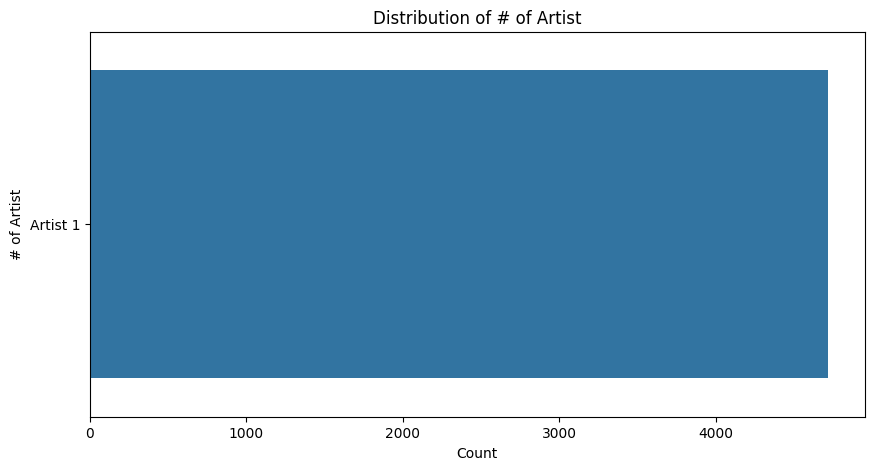

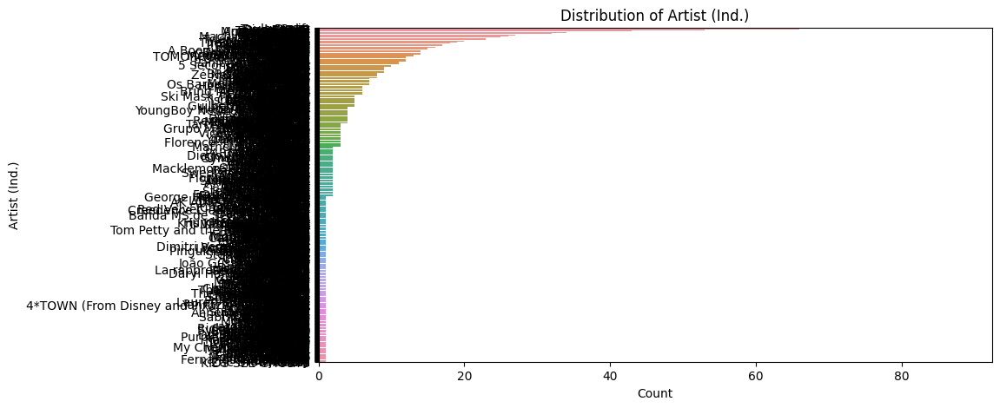

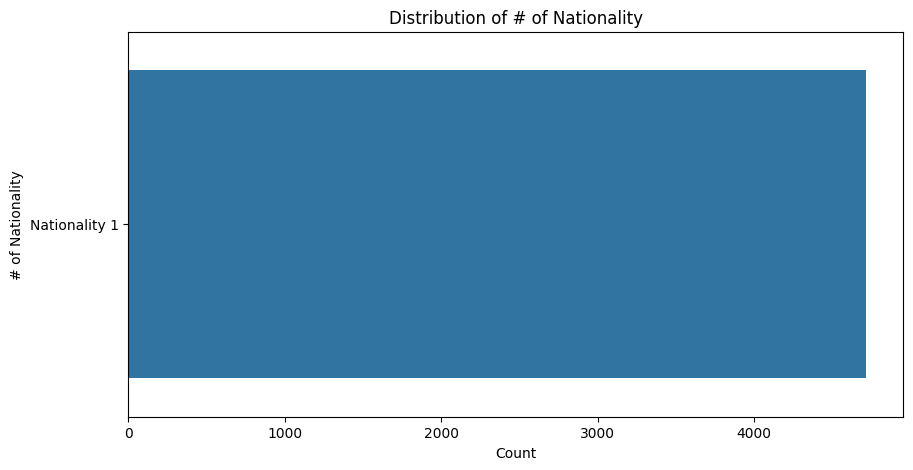

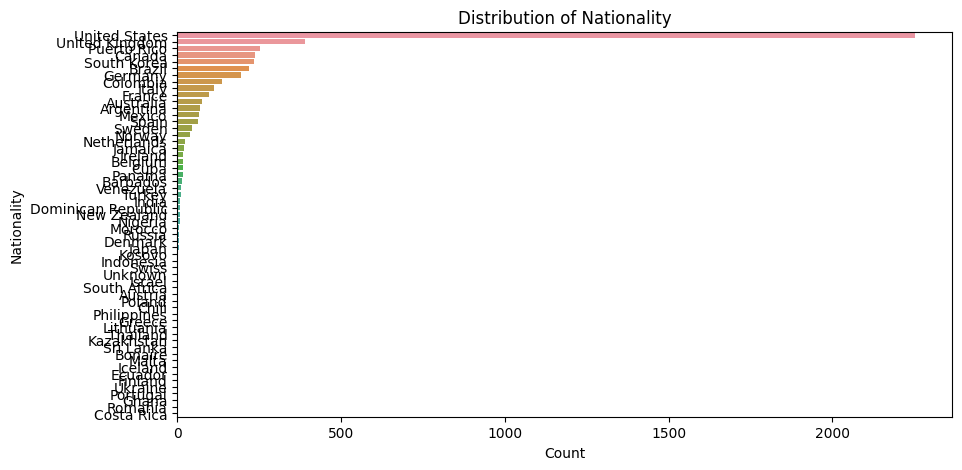

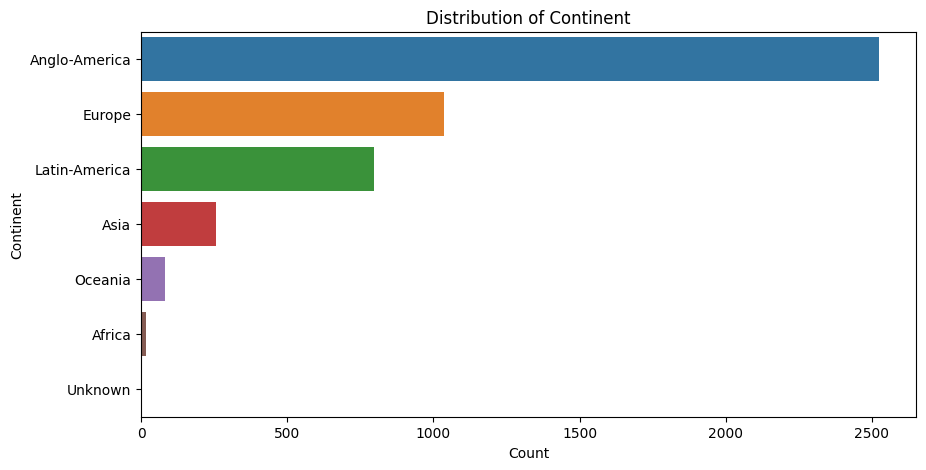

In [313]:
for feature in categorical_features:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df_rm_outliers, y=feature, order=df_rm_outliers[feature].value_counts().index)
    plt.title(f"Distribution of {feature}")
    plt.xlabel("Count")
    plt.ylabel(feature)
    plt.show()


In [21]:
top_n = 15
top_nationalities = df_rm_outliers['Nationality'].value_counts().nlargest(top_n).index
df_rm_outliers['Nationality'] = df_rm_outliers['Nationality'].apply(lambda x: x if x in top_nationalities else 'Other')
print(df_rm_outliers['Nationality'].value_counts())

Nationality
United States     151108
United Kingdom     53342
Puerto Rico        51663
Other              25731
Canada             23910
Colombia           20297
Brazil              9777
Spain               8822
Australia           8553
South Korea         8338
Mexico              5829
Argentina           5767
Germany             4304
France              4146
Sweden              3591
Italy               3545
Name: count, dtype: int64


In [ ]:
df_rm_outliers['Date'] = pd.to_datetime(df_rm_outliers['Date'], dayfirst=True, errors='coerce')
df_rm_outliers['Year'] = df_rm_outliers['Date'].dt.year
df_rm_outliers['Month'] = df_rm_outliers['Date'].dt.month

df_rm_outliers['Month_Quarter'] = df_rm_outliers['Date'].dt.day.apply(lambda x: 1 if x <= 15 else 2)
df_rm_outliers['Year'] = df_rm_outliers['Year'].astype('category')
df_rm_outliers['Month'] = df_rm_outliers['Month'].astype('category')
df_rm_outliers['Month_Quarter'] = df_rm_outliers['Month_Quarter'].astype('category')

In [ ]:
threshold = 0.5
# Remove the Instrumentalness column since it is distributed too close to zero giving problems to normalize it
df_rm_outliers['Is_Instrumental'] = df_rm_outliers['Instrumentalness'].apply(lambda x: 1 if x > threshold else 0)
df_rm_outliers['Is_Instrumental'] = df_rm_outliers['Is_Instrumental'].astype('category')
categorical_features.append('Is_Instrumental')



In [24]:
print(df_rm_outliers[['Date', 'Year', 'Month', 'Month_Quarter']].head())

        Date  Year Month Month_Quarter
0 2023-05-29  2023     5             2
1 2023-05-29  2023     5             2
5 2023-05-29  2023     5             2
6 2023-05-29  2023     5             2
7 2023-05-29  2023     5             2


/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option i

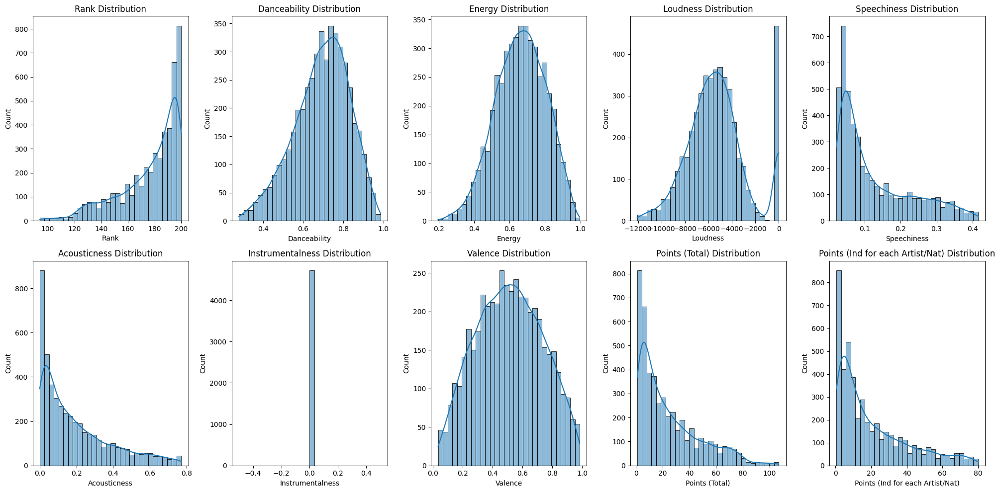

In [318]:
plt.figure(figsize=(20, 10))
for i, col in enumerate(numerical_features, 1):
    plt.subplot(2, 5, i)
    sns.histplot(df_rm_outliers[col], kde=True, bins=30)
    plt.title(f'{col} Distribution')
plt.tight_layout()
plt.show()

In [25]:
features_to_standardize = ['Rank', 'Danceability', 'Energy', 'Valence', 'Points (Total)', 'Points (Ind for each Artist/Nat)']
scaler = StandardScaler()
df_rm_outliers[features_to_standardize] = scaler.fit_transform(df_rm_outliers[features_to_standardize])

In [26]:
df_rm_outliers.head()


,Rank,Title,Artists,Date,Danceability,Energy,Loudness,Speechiness,Acousticness,Instrumentalness,...,Points (Total),Points (Ind for each Artist/Nat),id,Song URL,Genre,Parent Genre,Year,Month,Month_Quarter,Is_Instrumental
0,-1.723677,Ella Baila Sola,"Eslabon Armado, Peso Pluma",2023-05-29,-0.284650,0.653058,-5176.0,0.033,0.483,0.0,...,1.723677,0.525495,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,corrido,latin,2023,5,2,0
1,-1.723677,Ella Baila Sola,"Eslabon Armado, Peso Pluma",2023-05-29,-0.284650,0.653058,-5176.0,0.033,0.483,0.0,...,1.723677,0.525495,3qQbCzHBycnDpGskqOWY0E,https://open.spotify.com/track/3qQbCzHBycnDpGs...,corrido,latin,2023,5,2,0
5,-1.671458,Cupid - Twin Ver.,FIFTY FIFTY,2023-05-29,0.650123,-0.557970,-8332.0,0.033,0.435,0.0,...,1.671458,2.314610,7FbrGaHYVDmfr7KoLIZnQ7,https://open.spotify.com/track/7FbrGaHYVDmfr7K...,k-pop-girl-group,pop,2023,5,2,0
6,-1.654051,un x100to,"Grupo Frontera, Bad Bunny",2023-05-29,-1.089368,0.405016,-4076.0,0.047,0.228,0.0,...,1.654051,0.488606,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...,musica-chihuahuense,latin,2023,5,2,0
7,-1.654051,un x100to,"Grupo Frontera, Bad Bunny",2023-05-29,-1.089368,0.405016,-4076.0,0.047,0.228,0.0,...,1.654051,0.488606,6pD0ufEQq0xdHSsRbg9LBK,https://open.spotify.com/track/6pD0ufEQq0xdHSs...,musica-chihuahuense,latin,2023,5,2,0


/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option i

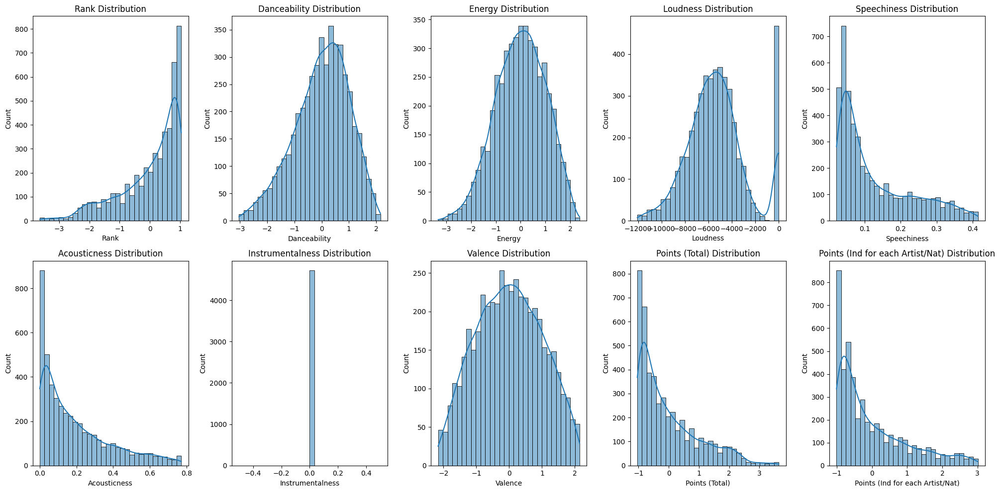

In [321]:
plt.figure(figsize=(20, 10))
for i, col in enumerate(numerical_features, 1):
    plt.subplot(2, 5, i)
    sns.histplot(df_rm_outliers[col], kde=True, bins=30)
    plt.title(f'{col} Distribution')
plt.tight_layout()
plt.show()

In [27]:
features_to_log_transform = ['Loudness', 'Speechiness', 'Acousticness']
df_transformed = df_rm_outliers.copy()
df_transformed[features_to_log_transform] = df_transformed[features_to_log_transform].apply(lambda x: np.log1p(x - x.min() + 1))

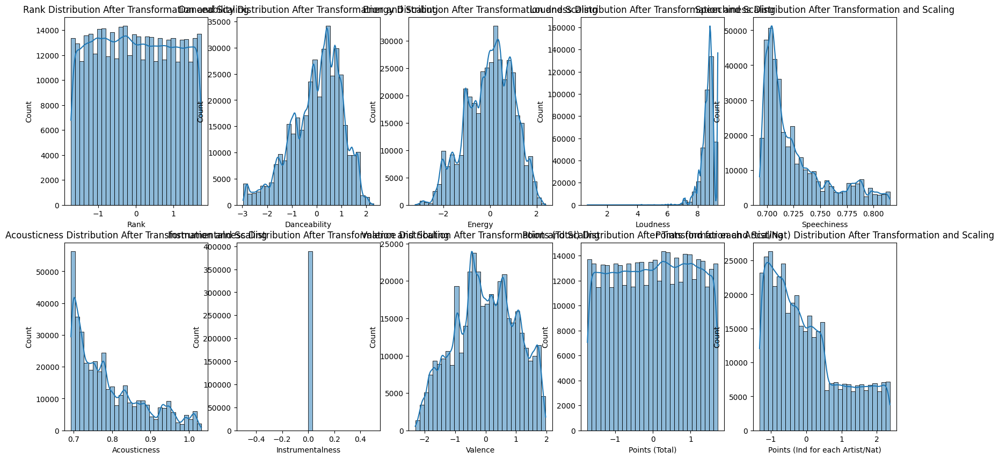

In [28]:
plt.figure(figsize=(20, 10))
for i, feature in enumerate(numerical_features, 1):
    plt.subplot(2, 5, i)
    sns.histplot(df_transformed[feature], kde=True, bins=30)
    plt.title(f'{feature} Distribution After Transformation and Scaling')
    plt.xlabel(feature)
    plt.ylabel('Count')

As we can observe column for Instrumentalness is too close to 1 so we are going to use Is_Instrumental instead.

In [29]:
df_transformed.drop(columns=["Instrumentalness"], inplace=True)


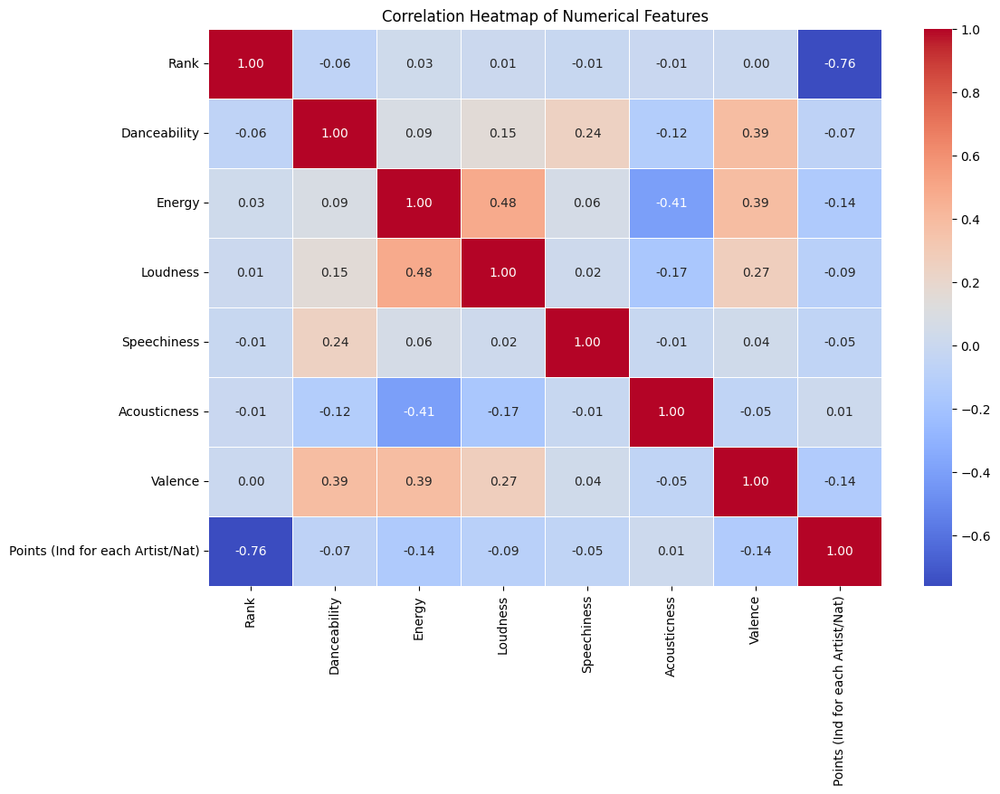

In [ ]:
numerical_features = ['Rank', 'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Valence', 'Points (Ind for each Artist/Nat)']

correlation_matrix = df_transformed[numerical_features].corr()

# Heatmap plot
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()

/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniforge/base/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option i

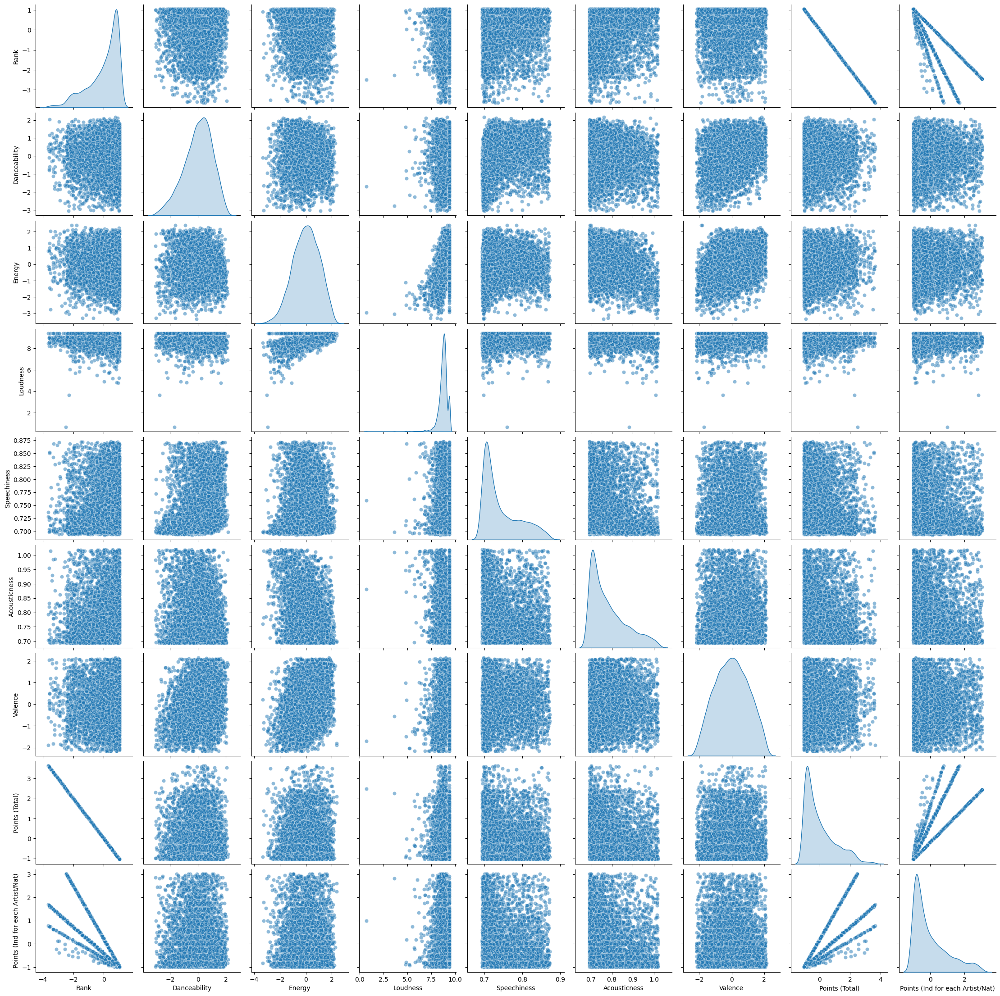

In [326]:
sns.pairplot(df_transformed[numerical_features], diag_kind="kde", plot_kws={'alpha': 0.5})
plt.show()

In [ ]:
# Correlation threshold
threshold = 0.7

# Loops to find feature pairs with correlation higher than the threshold
correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)


print(correlated_features)
df_transformed = df_transformed.drop(columns=correlated_features)
numerical_features = [feature for feature in numerical_features if feature not in list(correlated_features)]
print(numerical_features)


{'Points (Ind for each Artist/Nat)'}
['Rank', 'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Valence']


## Visualization and dim. redcution

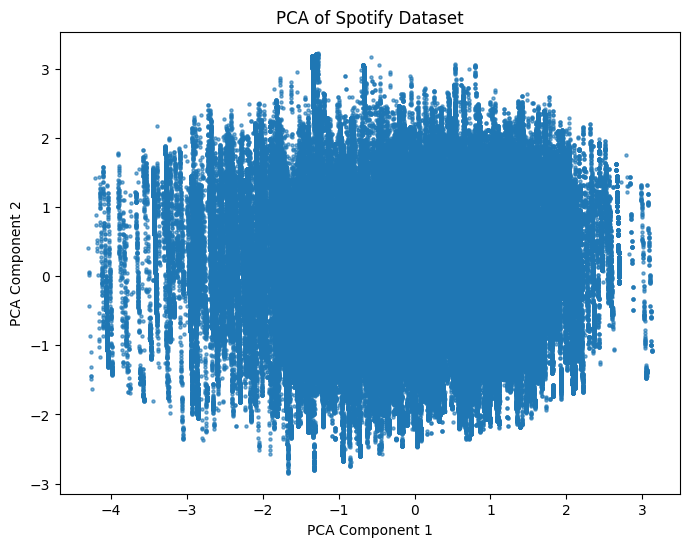

In [ ]:
# PCA
pca = PCA(n_components=2)  # Reduce to 2D for visualization
pca_components = pca.fit_transform(df_transformed[numerical_features])

# Plotting
plt.figure(figsize=(8, 6))
plt.scatter(pca_components[:, 0], pca_components[:, 1], alpha=0.6, s=5)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA of Spotify Dataset')
plt.show()

# Test preprocess

In [32]:
numerical_features = df.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = ["Title", "Artists", "Date", "# of Artist", "Artist (Ind.)", "# of Nationality", "Nationality", "Continent"]

for feature in categorical_features:
    df_test[feature] = df_test[feature].apply(clean_text)

In [33]:
df_rm_outliers_test = remove_outliers_iqr(df_test, numerical_features)
print(df_rm_outliers_test.shape)

(87323, 22)


In [ ]:
df_rm_outliers_test['Date'] = pd.to_datetime(df_rm_outliers_test['Date'], dayfirst=True, errors='coerce')
df_rm_outliers_test['Year'] = df_rm_outliers_test['Date'].dt.year
df_rm_outliers_test['Month'] = df_rm_outliers_test['Date'].dt.month

df_rm_outliers_test['Month_Quarter'] = df_rm_outliers_test['Date'].dt.day.apply(lambda x: 1 if x <= 15 else 2)
df_rm_outliers_test['Year'] = df_rm_outliers_test['Year'].astype('category')
df_rm_outliers_test['Month'] = df_rm_outliers_test['Month'].astype('category')
df_rm_outliers_test['Month_Quarter'] = df_rm_outliers_test['Month_Quarter'].astype('category')

In [35]:
threshold = 0.5
# Remove the Instrumentalness column since it is distributed too close to zero giving problems to normalize it.
df_rm_outliers_test['Is_Instrumental'] = df_rm_outliers_test['Instrumentalness'].apply(lambda x: 1 if x > threshold else 0)
df_rm_outliers_test['Is_Instrumental'] = df_rm_outliers_test['Is_Instrumental'].astype('category')
categorical_features.append('Is_Instrumental')

In [36]:
df_rm_outliers_test[features_to_standardize] = scaler.fit_transform(df_rm_outliers_test[features_to_standardize])

In [37]:
df_transformed_test = df_rm_outliers_test.copy()
df_transformed_test[features_to_log_transform] = df_transformed_test[features_to_log_transform].apply(lambda x: np.log1p(x - x.min() + 1))

In [38]:
df_transformed_test.drop(columns=["Instrumentalness"], inplace=True)

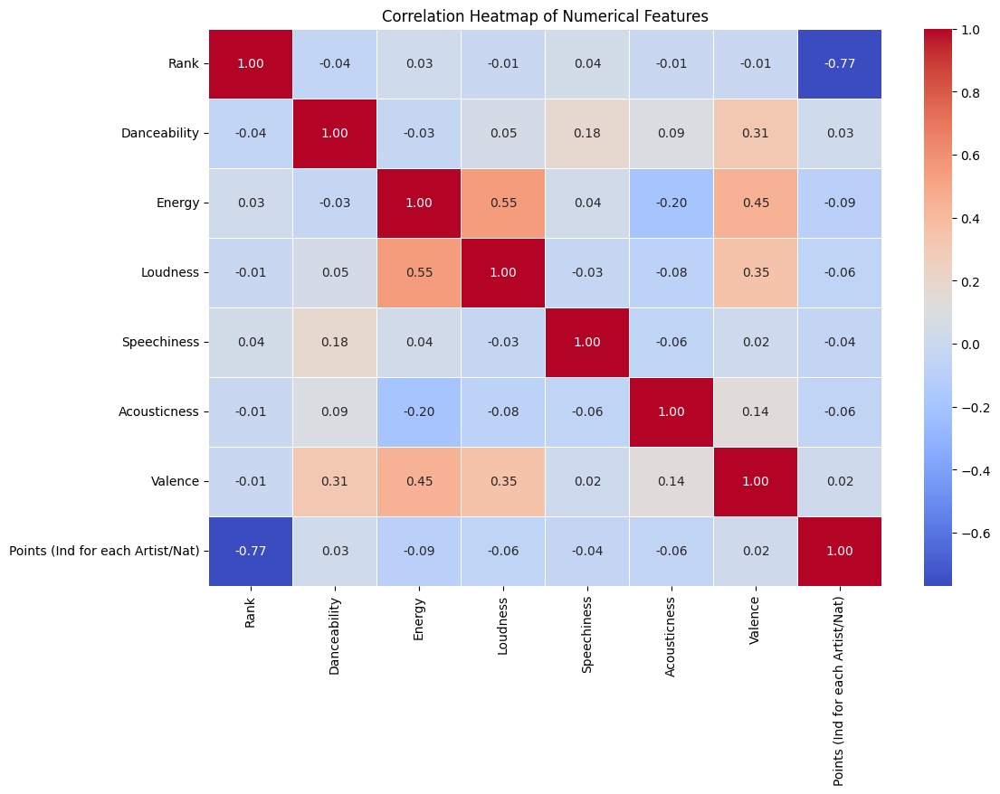

In [ ]:
numerical_features = ['Rank', 'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Valence', 'Points (Ind for each Artist/Nat)']
correlation_matrix_test = df_transformed_test[numerical_features].corr()

# Heatmap plot
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix_test, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Features")
plt.show()

In [40]:
# Use the correlated features that we get from the training set
df_transformed_test = df_transformed_test.drop(columns=correlated_features)
numerical_features = [feature for feature in numerical_features if feature not in list(correlated_features)]
print(numerical_features)


['Rank', 'Danceability', 'Energy', 'Loudness', 'Speechiness', 'Acousticness', 'Valence']


### Data Prep

In [41]:
df_transformed.columns

Index(['Rank', 'Title', 'Artists', 'Date', 'Danceability', 'Energy',
       'Loudness', 'Speechiness', 'Acousticness', 'Valence', '# of Artist',
       'Artist (Ind.)', '# of Nationality', 'Nationality', 'Continent',
       'Points (Total)', 'id', 'Song URL', 'Genre', 'Parent Genre', 'Year',
       'Month', 'Month_Quarter', 'Is_Instrumental'],
      dtype='object')

In [182]:
parent_genre = df_transformed['Parent Genre'].unique()

len(parent_genre)

13

In [183]:
df_transformed.dropna(inplace=True)
df_transformed_test.dropna(inplace=True)

In [184]:
len(df_transformed['Parent Genre'].unique()), len(df_transformed_test['Parent Genre'].unique())

(13, 12)

In [185]:
# Transforming date to correct format
df_transformed['Date'] = pd.to_datetime(df_transformed['Date'])
df_transformed_test['Date'] = pd.to_datetime(df_transformed_test['Date'])
df_transformed.shape, df_transformed_test.shape

((268486, 24), (60841, 24))

In [186]:
df_transformed.drop_duplicates(subset=['Title', 'Date', 'Parent Genre'], inplace=True)
df_transformed_test.drop_duplicates(subset=['Title', 'Date', 'Parent Genre'], inplace=True)
df_transformed.shape, df_transformed_test.shape

((268486, 24), (60841, 24))

In [ ]:
# Summation of points for each genre for a partiular date
genre_popularity = df_transformed.groupby(['Date', 'Parent Genre'])['Points (Total)'].sum().reset_index()
genre_popularity_test = df_transformed_test.groupby(['Date', 'Parent Genre'])['Points (Total)'].sum().reset_index()

# Min and max
old_min, old_max = genre_popularity['Points (Total)'].min(), genre_popularity['Points (Total)'].max()
old_min_test, old_max_test = genre_popularity_test['Points (Total)'].min(), genre_popularity_test['Points (Total)'].max()
new_min, new_max = 1, 1000

# Normalized Points (Total)
genre_popularity['Points (Total)'] = new_min + (genre_popularity['Points (Total)'] - old_min) * (new_max - new_min) / (old_max - old_min)
genre_popularity_test['Points (Total)'] = new_min + (genre_popularity_test['Points (Total)'] - old_min_test) * (new_max - new_min) / (old_max_test - old_min_test)

genre_popularity['Points (Total)'].max(), genre_popularity['Points (Total)'].min(), genre_popularity_test['Points (Total)'].max(), genre_popularity_test['Points (Total)'].min()


(np.float64(1000.0), np.float64(1.0), np.float64(1000.0), np.float64(1.0))

In [ ]:
# Pivoting the data to create a genre-by-date matrix
genre_time_series = genre_popularity.pivot(index='Date', columns='Parent Genre', values='Points (Total)').fillna(0)
genre_time_series_test = genre_popularity_test.pivot(index='Date', columns='Parent Genre', values='Points (Total)').fillna(0)

# Missing genres as columns with all zero values -Train
for genre in set(parent_genre) - set(genre_time_series.columns):
    genre_time_series[genre] = 0

# Missing genres as columns with all zero values - Test
for genre in set(parent_genre) - set(genre_time_series_test.columns):
    genre_time_series_test[genre] = 0

# Reordering columns for consistency
genre_time_series = genre_time_series.sort_index(axis=1)
genre_time_series_test = genre_time_series_test.sort_index(axis=1)

genre_time_series.shape, genre_time_series_test.shape

((1860, 13), (477, 13))

In [ ]:
# Generate lag features 
for genre in genre_time_series.columns:
    genre_time_series[f'{genre}_lag_1'] = genre_time_series[genre].shift(1)
    genre_time_series[f'{genre}_rolling_avg'] = genre_time_series[genre].rolling(window=7).mean()

# Generate lag features for Test
for genre in genre_time_series_test.columns:
    genre_time_series_test[f'{genre}_lag_1'] = genre_time_series_test[genre].shift(1)
    genre_time_series_test[f'{genre}_rolling_avg'] = genre_time_series_test[genre].rolling(window=7).mean()

In [ ]:
# Fill NaN values created by the rolling mean and shift functions
genre_time_series.fillna(0, inplace=True)

# Additional time-based features
genre_time_series['Year'] = genre_time_series.index.year
genre_time_series['Month'] = genre_time_series.index.month
genre_time_series['Quarter'] = genre_time_series.index.quarter
genre_time_series['DayOfWeek'] = genre_time_series.index.dayofweek

# TEST

# Fill NaN values created by the rolling mean and shift functions
genre_time_series_test.fillna(0, inplace=True)

# Additional time-based features
genre_time_series_test['Year'] = genre_time_series_test.index.year
genre_time_series_test['Month'] = genre_time_series_test.index.month
genre_time_series_test['Quarter'] = genre_time_series_test.index.quarter
genre_time_series_test['DayOfWeek'] = genre_time_series_test.index.dayofweek


## Model 1

### Model Training

In [ ]:
# Features and target
# X will contain all features except for the main genre popularity columns
# y will contain the main genre popularity columns (targets for regression)
train_X = genre_time_series.drop(columns=genre_time_series.columns[:len(parent_genre)])
train_y = genre_time_series[genre_time_series.columns[:len(parent_genre)]]

test_X = genre_time_series_test.drop(columns=genre_time_series_test.columns[:len(parent_genre)])
test_y = genre_time_series_test[genre_time_series_test.columns[:len(parent_genre)]]

In [192]:
train_X.shape, train_y.shape, test_X.shape, test_y.shape

((1860, 30), (1860, 13), (477, 30), (477, 13))

In [193]:
train_X.columns, test_X.columns

(Index(['Electronic_lag_1', 'Electronic_rolling_avg', 'Folk/Acoustic_lag_1',
        'Folk/Acoustic_rolling_avg', 'Hip Hop_lag_1', 'Hip Hop_rolling_avg',
        'R&B_lag_1', 'R&B_rolling_avg', 'World/Traditional_lag_1',
        'World/Traditional_rolling_avg', 'classical_lag_1',
        'classical_rolling_avg', 'country_lag_1', 'country_rolling_avg',
        'easy listening_lag_1', 'easy listening_rolling_avg', 'jazz_lag_1',
        'jazz_rolling_avg', 'latin_lag_1', 'latin_rolling_avg', 'metal_lag_1',
        'metal_rolling_avg', 'pop_lag_1', 'pop_rolling_avg', 'rock_lag_1',
        'rock_rolling_avg', 'Year', 'Month', 'Quarter', 'DayOfWeek'],
       dtype='object', name='Parent Genre'),
 Index(['Electronic_lag_1', 'Electronic_rolling_avg', 'Folk/Acoustic_lag_1',
        'Folk/Acoustic_rolling_avg', 'Hip Hop_lag_1', 'Hip Hop_rolling_avg',
        'R&B_lag_1', 'R&B_rolling_avg', 'World/Traditional_lag_1',
        'World/Traditional_rolling_avg', 'classical_lag_1',
        'classical_r

In [ ]:
# MultiOutputRegressor with XGBoost
model = MultiOutputRegressor(XGBRegressor(objective='reg:squarederror'))

# Train
model.fit(train_X, train_y)

# Predictions
predictions = model.predict(test_X)

### Model Evaluation

In [ ]:
# Mean Absolute Error for evaluation
mae = mean_absolute_error(test_y, predictions)
print(f'Mean Absolute Error (Overall): {mae:.2f}')

# Mean Squared Error and then Root Mean Squared Error for evaluation
mse = mean_squared_error(test_y, predictions)
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (Overall): {rmse:.2f}')

# List of genres
genres = parent_genre

# Metrics per genre
mae_per_genre = mean_absolute_error(test_y, predictions, multioutput='raw_values')
mse_per_genre = mean_squared_error(test_y, predictions, multioutput='raw_values')
rmse_per_genre = np.sqrt(mse_per_genre)

# Displaying the metrics for each genre
i = 0
for genre in genres:
    if genre in test_y.columns:
        print(f"\nMetrics for genre '{genre}':")
        print(f"  Mean Absolute Error (MAE): {mae_per_genre[i]:.2f}")
        print(f"  Root Mean Squared Error (RMSE): {rmse_per_genre[i]:.2f}")
        i += 1
    else:
        print(f"\n'{genre}': Not in the test set")

Mean Absolute Error (Overall): 47.91
Root Mean Squared Error (Overall): 88.86

Metrics for genre 'latin':
  Mean Absolute Error (MAE): 38.81
  Root Mean Squared Error (RMSE): 50.52

Metrics for genre 'pop':
  Mean Absolute Error (MAE): 123.00
  Root Mean Squared Error (RMSE): 164.87

Metrics for genre 'Hip Hop':
  Mean Absolute Error (MAE): 64.11
  Root Mean Squared Error (RMSE): 85.16

Metrics for genre 'R&B':
  Mean Absolute Error (MAE): 28.12
  Root Mean Squared Error (RMSE): 50.03

Metrics for genre 'country':
  Mean Absolute Error (MAE): 42.20
  Root Mean Squared Error (RMSE): 81.41

Metrics for genre 'Electronic':
  Mean Absolute Error (MAE): 0.05
  Root Mean Squared Error (RMSE): 0.26

Metrics for genre 'rock':
  Mean Absolute Error (MAE): 62.49
  Root Mean Squared Error (RMSE): 107.58

Metrics for genre 'World/Traditional':
  Mean Absolute Error (MAE): 40.25
  Root Mean Squared Error (RMSE): 98.06

Metrics for genre 'Folk/Acoustic':
  Mean Absolute Error (MAE): 1.90
  Root Mean

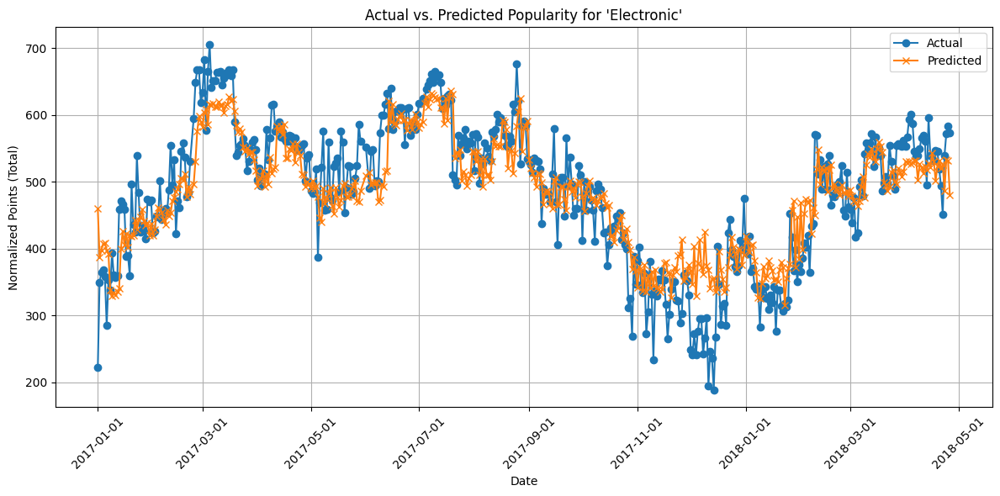

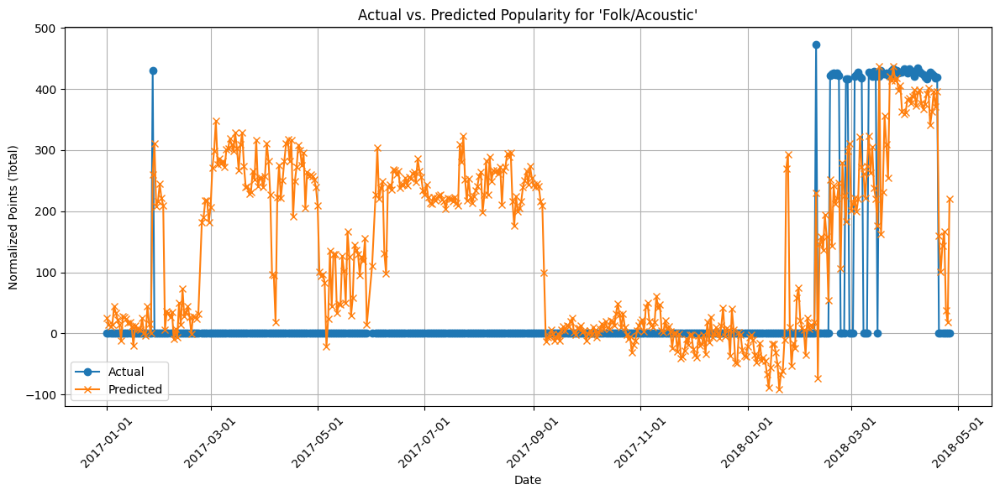

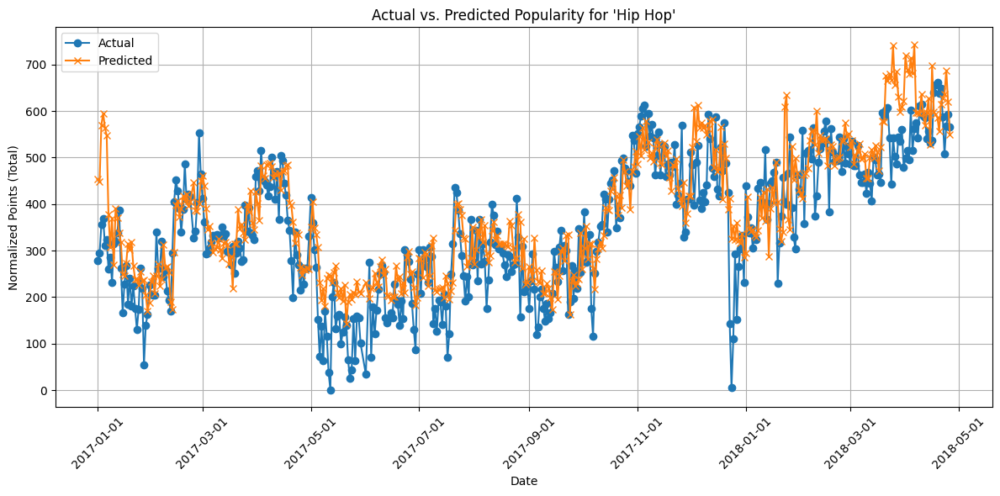

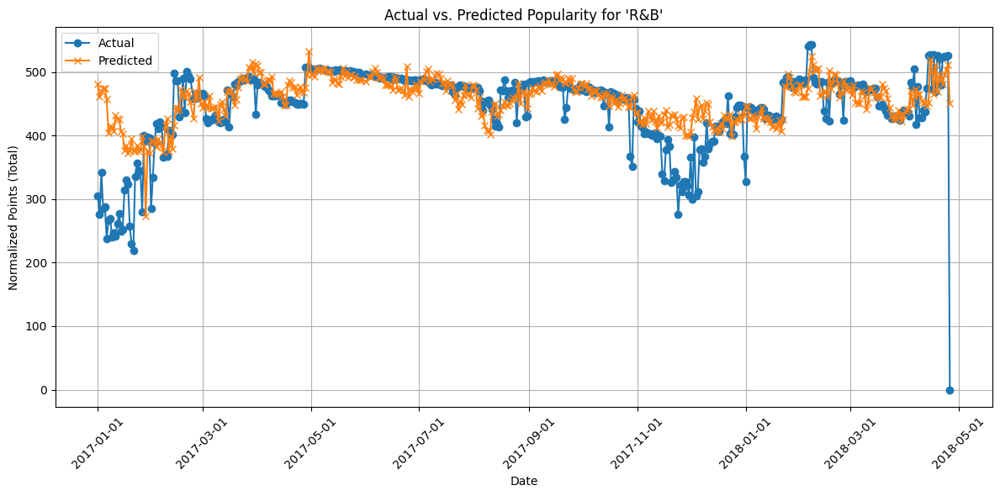

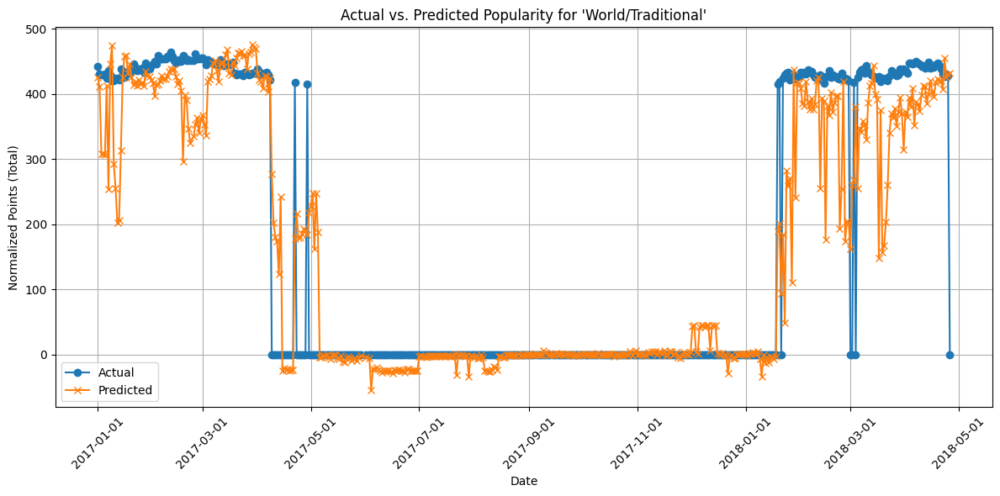

...

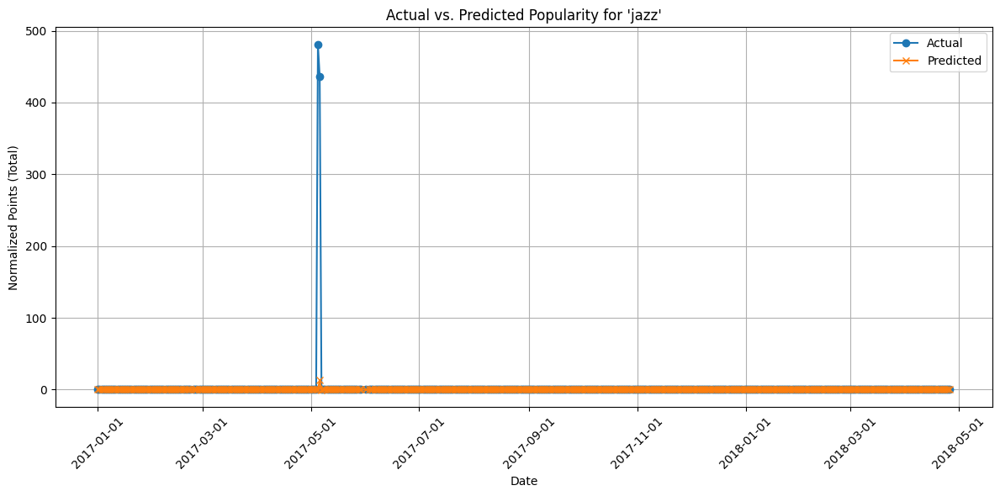

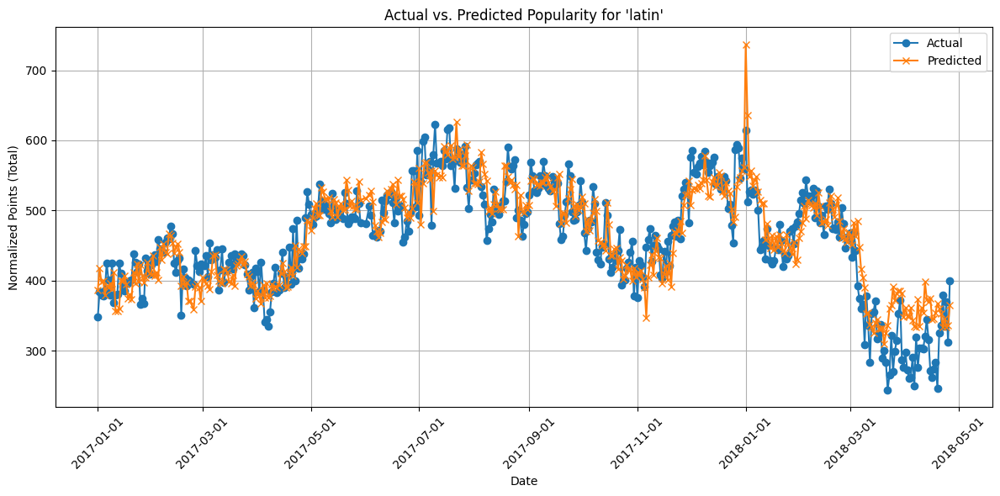

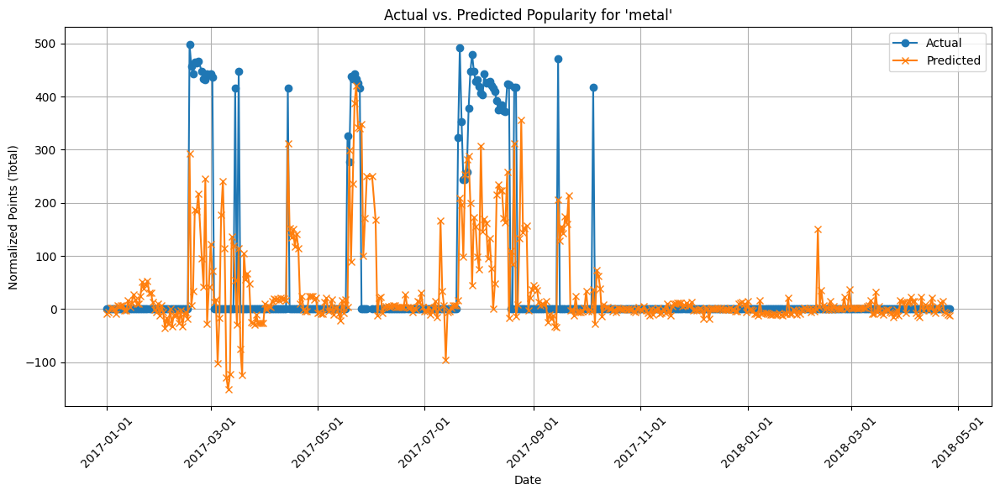

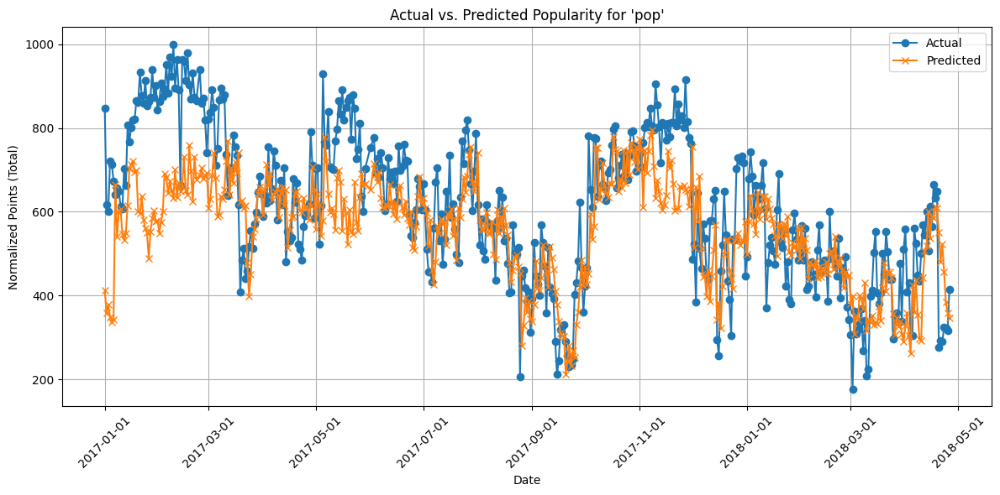

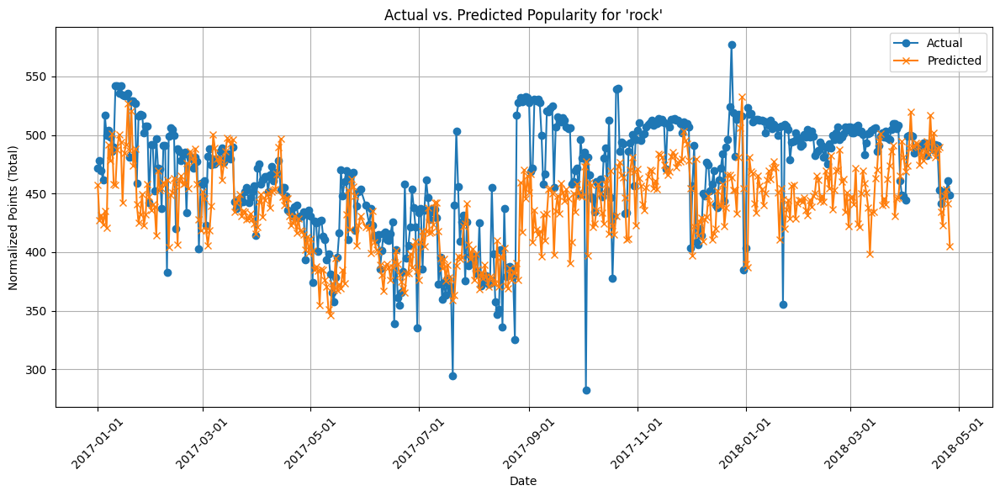

In [ ]:
# Convert predictions to DataFrame with the same index and columns as test_y
predictions_df = pd.DataFrame(predictions, index=test_y.index, columns=test_y.columns)

# Plot actual vs. predicted values for each genre over time
for genre in test_y.columns:
    plt.figure(figsize=(12, 6))
    plt.plot(test_y.index, test_y[genre], label='Actual', marker='o')
    plt.plot(predictions_df.index, predictions_df[genre], label='Predicted', marker='x')
    plt.title(f"Actual vs. Predicted Popularity for '{genre}'")
    plt.xlabel('Date')
    plt.ylabel('Normalized Points (Total)')
    plt.legend()
    plt.grid(True)
    
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()


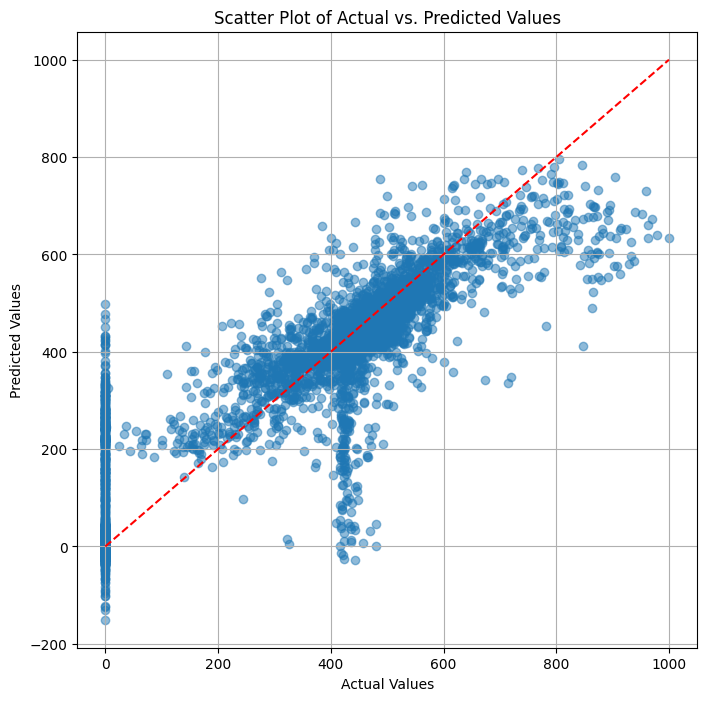

In [ ]:
# Flatten the actual and predicted values
actual_values = test_y.values.flatten()
predicted_values = predictions.flatten()

# Scatter plot
plt.figure(figsize=(8, 8))
plt.scatter(actual_values, predicted_values, alpha=0.5)
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'r--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs. Predicted Values')
plt.grid(True)
plt.show()


### Model Predictions

In [ ]:
# Most popular genre is finding the genre with the highest predicted points on each date
predicted_genres = np.argsort(-predictions, axis=1)
predicted_top_genres = [train_y.columns[i] for i in predicted_genres]

# Display predictions
test_dates = test_X.index
results = pd.DataFrame({'Date': test_dates, 'Top_Predicted_Genre': predicted_top_genres})
print(results)

          Date                                Top_Predicted_Genre
0   2017-01-01  Index(['R&B', 'Electronic', 'rock', 'Hip Hop',...
1   2017-01-02  Index(['R&B', 'Hip Hop', 'rock', 'latin', 'Wor...
2   2017-01-03  Index(['Hip Hop', 'R&B', 'rock', 'latin', 'Ele...
3   2017-01-04  Index(['Hip Hop', 'R&B', 'rock', 'Electronic',...
4   2017-01-05  Index(['Hip Hop', 'R&B', 'rock', 'Electronic',...
..         ...                                                ...
472 2018-04-22  Index(['Hip Hop', 'Electronic', 'pop', 'R&B', ...
473 2018-04-23  Index(['Hip Hop', 'R&B', 'Electronic', 'pop', ...
474 2018-04-24  Index(['Hip Hop', 'Electronic', 'R&B', 'rock',...
475 2018-04-25  Index(['Hip Hop', 'Electronic', 'R&B', 'rock',...
476 2018-04-26  Index(['Hip Hop', 'Electronic', 'R&B', 'World/...

[477 rows x 2 columns]


## MODEL 2 ---------->  Prophet

### Model Training

In [199]:
# Prepare a dictionary to store the Prophet model and forecast for each genre
genre_models = {}
genre_forecasts = {}
mae_scores = {}
total_mae_sum = 0
total_test_points = 0

# Initialize dictionaries to store RMSE for each genre
rmse_scores = {}
total_rmse_sum = 0
total_test_points = 0

In [ ]:
# Get the list of unique parent genres
unique_genres = parent_genre

# Loop over each genre and create a Prophet model
for genre in unique_genres:
    # Filter data for the current genre
    df_genre = genre_popularity[genre_popularity['Parent Genre'] == genre][['Date', 'Points (Total)']].copy()
    df_genre_test = genre_popularity_test[genre_popularity_test['Parent Genre'] == genre][['Date', 'Points (Total)']].copy()
    
    # Rename columns to fit Prophet's requirements
    df_genre = df_genre.rename(columns={'Date': 'ds', 'Points (Total)': 'y'})
    df_genre_test = df_genre_test.rename(columns={'Date': 'ds', 'Points (Total)': 'y'})


    df_genre['lag_1'] = df_genre['y'].shift(1)
    df_genre['rolling_average'] = df_genre['y'].rolling(window=7).mean()
    df_genre['year'] = df_genre['ds'].dt.year
    df_genre['month'] = df_genre['ds'].dt.month
    df_genre['quarter'] = df_genre['ds'].dt.quarter
    df_genre['day_of_week'] = df_genre['ds'].dt.dayofweek
    df_genre.fillna(0, inplace=True)

    df_genre_test['lag_1'] = df_genre_test['y'].shift(1)
    df_genre_test['rolling_average'] = df_genre_test['y'].rolling(window=7).mean()
    df_genre_test['year'] = df_genre_test['ds'].dt.year
    df_genre_test['month'] = df_genre_test['ds'].dt.month
    df_genre_test['quarter'] = df_genre_test['ds'].dt.quarter
    df_genre_test['day_of_week'] = df_genre_test['ds'].dt.dayofweek
    df_genre_test.fillna(0, inplace=True)

    # Initializing and fit the Prophet model on the training data
    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=False)

    # Adding extra regressors for lagged values, rolling averages, and temporal features
    model.add_regressor('lag_1')
    model.add_regressor('rolling_average')
    model.add_regressor('year')
    model.add_regressor('month')
    model.add_regressor('quarter')
    model.add_regressor('day_of_week')

    if genre in genre_popularity['Parent Genre'].unique():
        model.fit(df_genre)
    
        # Store the model for future reference
        genre_models[genre] = model
    else:
        genre_models[genre] = 'No Model'
    
    # Make predictions on the test set dates
    if genre in genre_popularity_test['Parent Genre'].unique():
        forecast = model.predict(df_genre_test[['ds', 'lag_1', 'rolling_average', 'year', 'month', 'quarter', 'day_of_week']])
    
        # Store the forecast in the dictionary
        genre_forecasts[genre] = forecast
        
        # Calculate MAE for the test set
        mae = mean_absolute_error(df_genre_test['y'], forecast['yhat'])
        mae_scores[genre] = mae

        # Aggregate for overall MAE calculation
        total_mae_sum += mae * len(df_genre_test)
        total_test_points += len(df_genre_test)

        # Extract actual and predicted values
        actual_values = df_genre_test['y'].values
        predicted_values = forecast.loc[forecast['ds'].isin(df_genre_test['ds']), 'yhat'].values
        
        # Calculate RMSE for the current genre
        rmse = np.sqrt(mean_squared_error(df_genre_test['y'], forecast['yhat']))
        rmse_scores[genre] = rmse
    
    
        # Aggregate for overall RMSE calculation
        total_rmse_sum += rmse**2 * len(df_genre_test)
        total_test_points += len(df_genre_test)
    else:
        mae_scores[genre] = 0
        rmse_scores[genre] = 0


07:02:35 - cmdstanpy - INFO - Chain [1] start processing
07:02:35 - cmdstanpy - INFO - Chain [1] done processing
07:02:36 - cmdstanpy - INFO - Chain [1] start processing
07:02:36 - cmdstanpy - INFO - Chain [1] done processing
07:02:36 - cmdstanpy - INFO - Chain [1] start processing
07:02:36 - cmdstanpy - INFO - Chain [1] done processing
07:02:37 - cmdstanpy - INFO - Chain [1] start processing
07:02:37 - cmdstanpy - INFO - Chain [1] done processing
07:02:37 - cmdstanpy - INFO - Chain [1] start processing
07:02:37 - cmdstanpy - INFO - Chain [1] done processing
07:02:38 - cmdstanpy - INFO - Chain [1] start processing
07:02:38 - cmdstanpy - INFO - Chain [1] done processing
07:02:39 - cmdstanpy - INFO - Chain [1] start processing
07:02:39 - cmdstanpy - INFO - Chain [1] done processing
07:02:39 - cmdstanpy - INFO - Chain [1] start processing
07:02:39 - cmdstanpy - INFO - Chain [1] done processing
07:02:39 - cmdstanpy - INFO - Chain [1] start processing
07:02:40 - cmdstanpy - INFO - Chain [1]

### MODEL Evaluation

In [ ]:
# MAE
overall_mae = total_mae_sum / total_test_points
print(f"\nOverall Mean Absolute Error across all genres: {overall_mae:.2f}")

# RMSE
overall_rmse = np.sqrt(total_rmse_sum / total_test_points)
print(f"\nOverall Root Mean Squared Error across all genres: {overall_rmse:.2f}")

# Display the MAE scores for all genres
print("\nMean Absolute Error for each genre:")
for genre, score in mae_scores.items():
    print(f"{genre}: {score:.2f}")

# Display the RMSE scores for all genres
print("\nRoot Mean Squared Error for each genre:")
for genre, score in rmse_scores.items():
    print(f"{genre}: {score:.2f}")


Overall Mean Absolute Error across all genres: 30.21

Overall Root Mean Squared Error across all genres: 70.18

Mean Absolute Error for each genre:
latin: 25.18
pop: 65.85
Hip Hop: 79.31
R&B: 40.82
country: 24.34
Electronic: 90.62
rock: 30.73
World/Traditional: 201.43
Folk/Acoustic: 9.49
metal: 86.10
easy listening: 62.72
classical: 0.00
jazz: 545.87

Root Mean Squared Error for each genre:
latin: 35.78
pop: 95.56
Hip Hop: 97.88
R&B: 47.91
country: 33.81
Electronic: 100.94
rock: 44.99
World/Traditional: 300.47
Folk/Acoustic: 19.30
metal: 100.66
easy listening: 66.43
classical: 0.00
jazz: 547.47


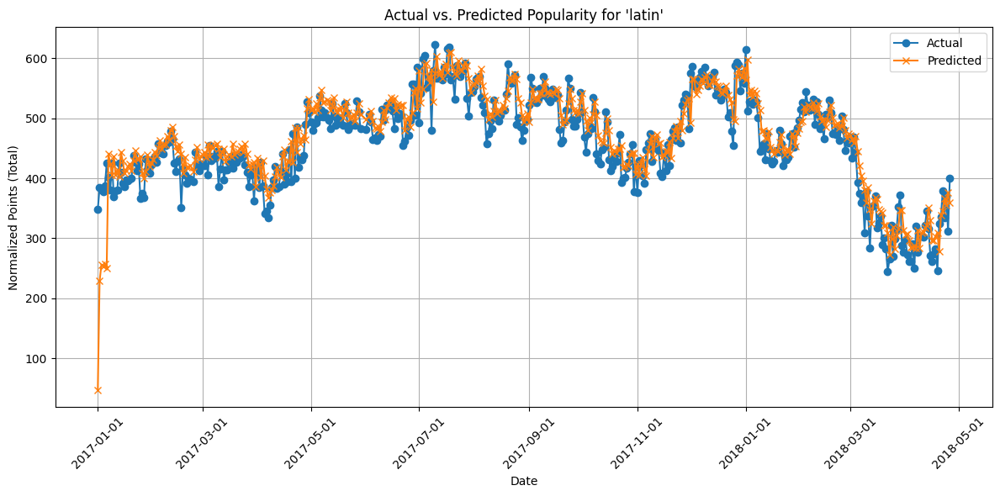

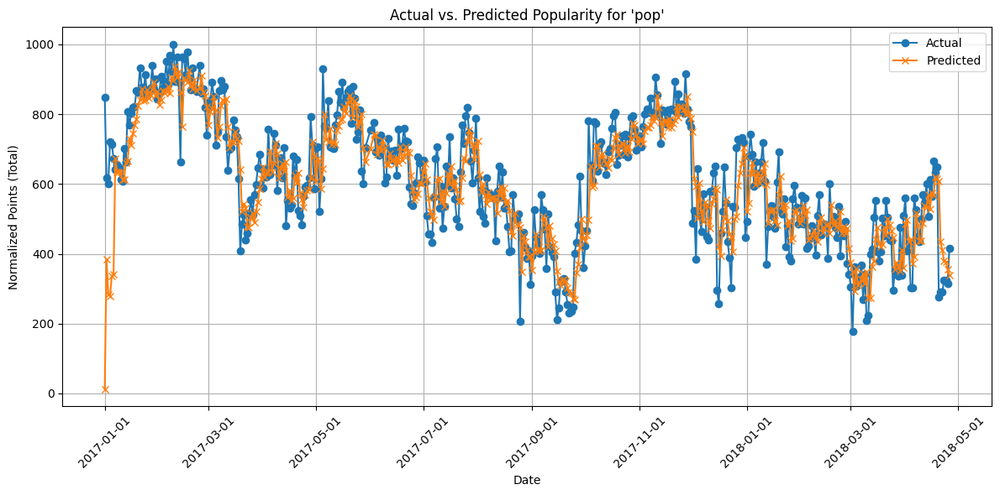

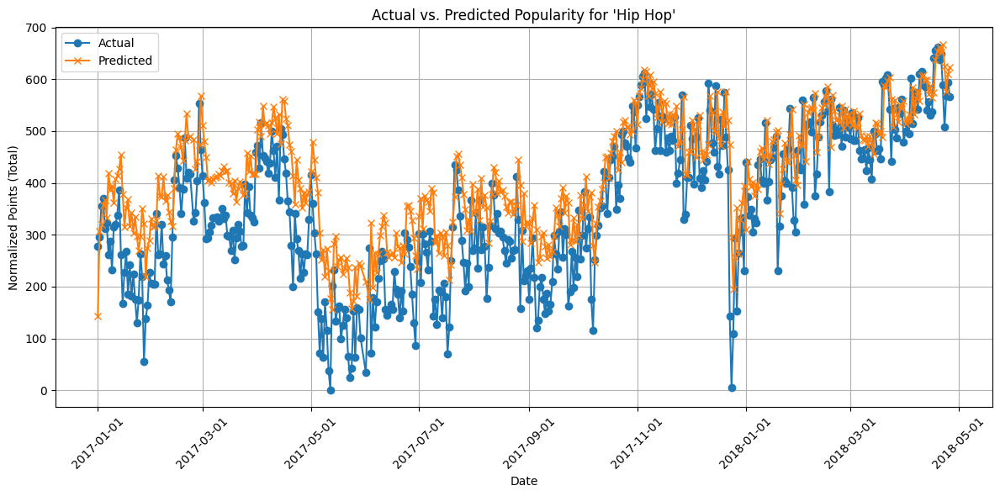

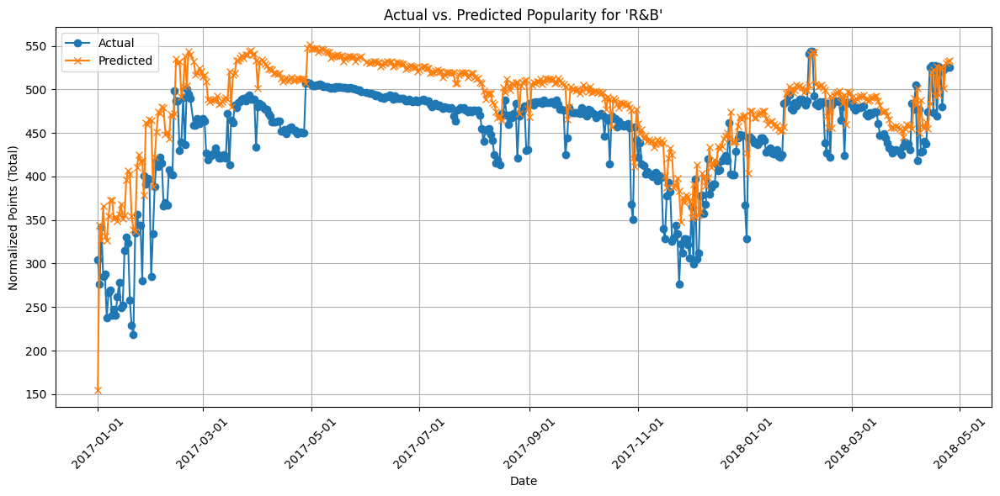

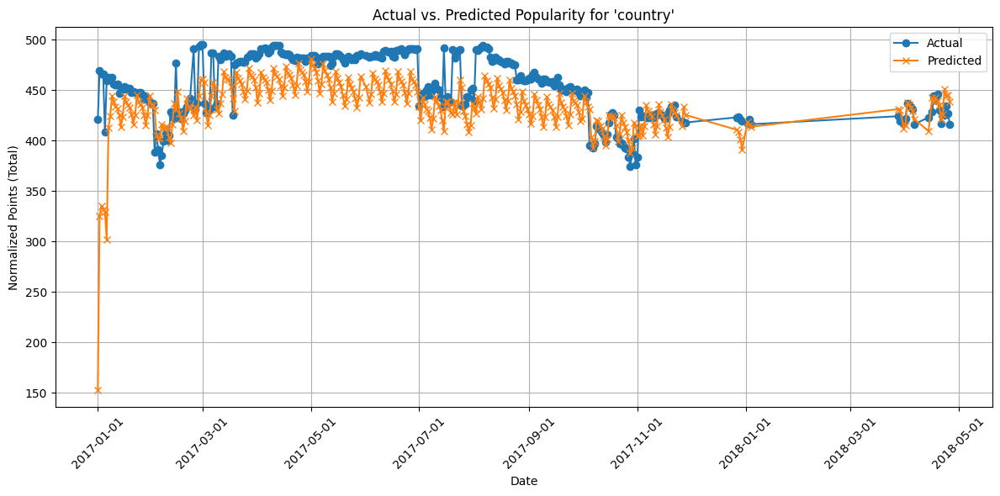

...

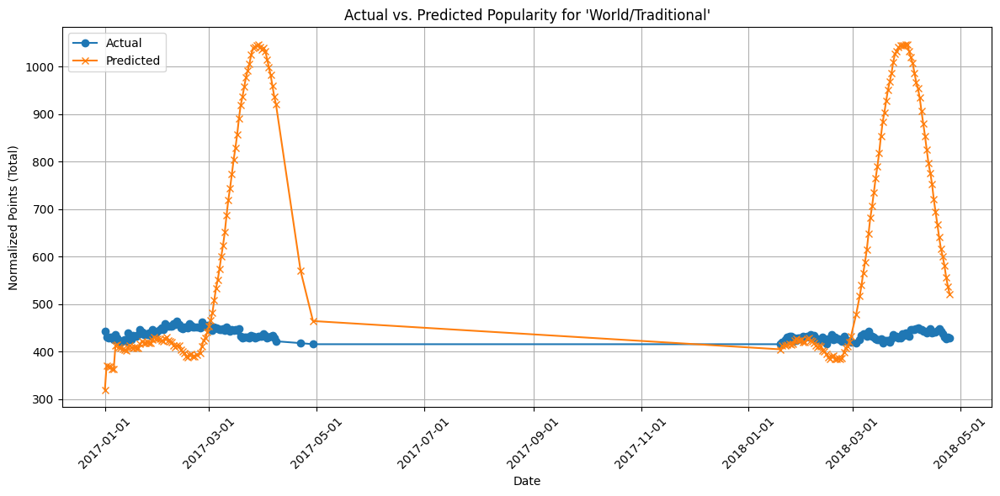

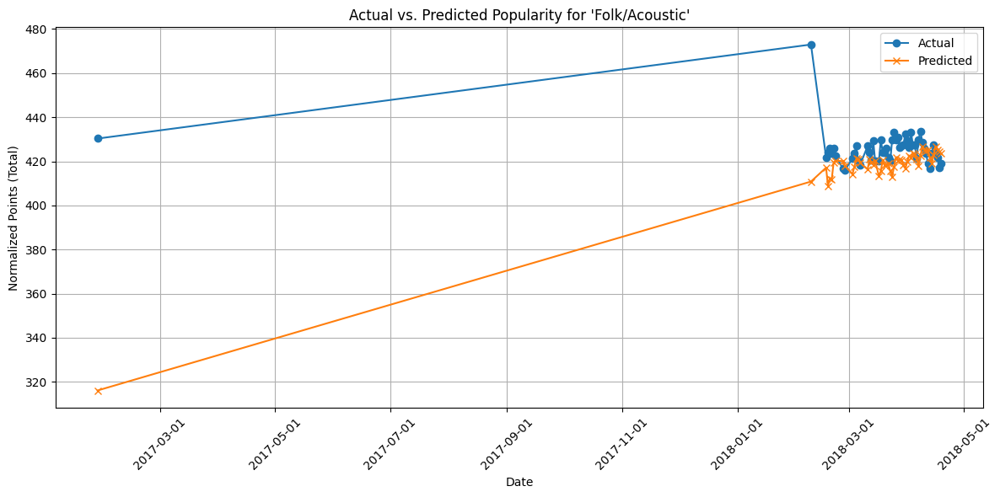

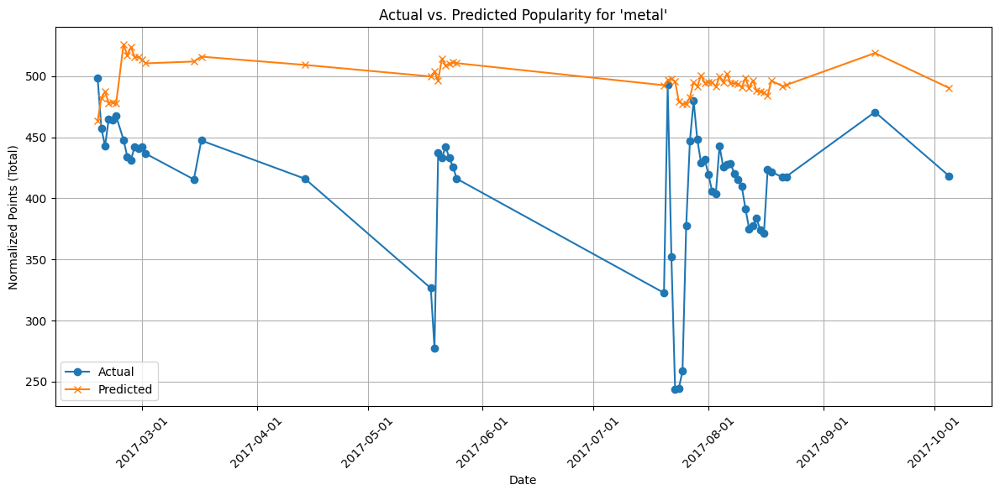

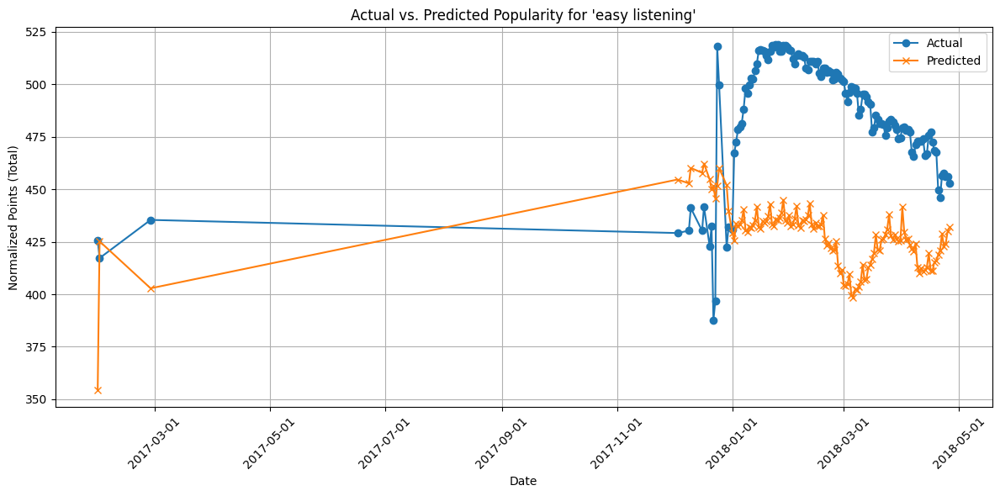

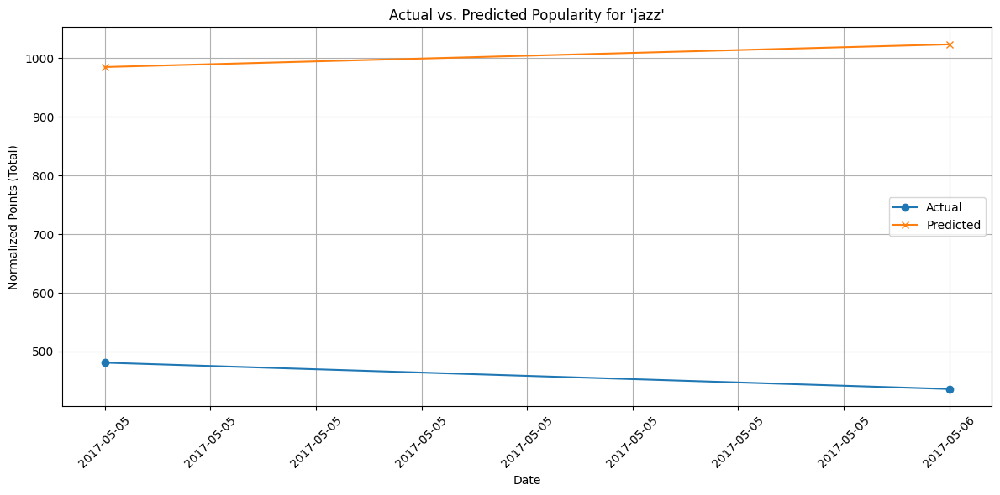

In [ ]:
# Loop over each genre and plot the actual vs. predicted values
for genre, forecast in genre_forecasts.items():
    # # Get test data for the current genre
    test_data = genre_popularity_test[genre_popularity_test['Parent Genre'] == genre][['Date', 'Points (Total)']].copy()
    test_data = test_data.rename(columns={'Date': 'ds', 'Points (Total)': 'y'})
    
    plt.figure(figsize=(12, 6))
    plt.plot(test_data['ds'], test_data['y'], label='Actual', marker='o')
    plt.plot(forecast['ds'], forecast['yhat'], label='Predicted', marker='x')
    plt.title(f"Actual vs. Predicted Popularity for '{genre}'")
    plt.xlabel('Date')
    plt.ylabel('Normalized Points (Total)')
    plt.legend()
    plt.grid(True)
    
    plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

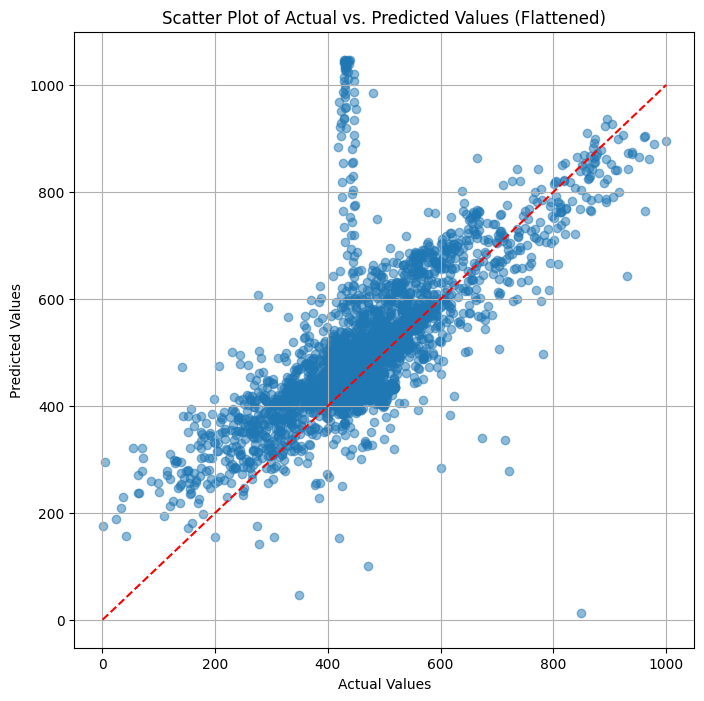

In [ ]:
actual_values = []
predicted_values = []

# Collect actual and predicted values
for genre, forecast in genre_forecasts.items():

    test_data = genre_popularity_test[genre_popularity_test['Parent Genre'] == genre][['Date', 'Points (Total)']].copy()
    test_data = test_data.rename(columns={'Date': 'ds', 'Points (Total)': 'y'})
    # Actual and predicted values in a flattened form
    actual_values.extend(test_data['y'].values)
    predicted_values.extend(forecast.loc[forecast['ds'].isin(test_data['ds']), 'yhat'].values)

# Convert to numpy arrays for plotting
actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

# Scatter plot
plt.figure(figsize=(8, 8))
plt.scatter(actual_values, predicted_values, alpha=0.5)
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'r--')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Scatter Plot of Actual vs. Predicted Values (Flattened)')
plt.grid(True)
plt.show()
